<center><img src="https://miro.medium.com/v2/resize:fit:300/0*gTbWMTKvNF-jLJrM.jpg" width=30% ></center>

# <center> Assignment 3: Harris Corner Detector & Optical Flow </center>
<center> Computer Vision 1, University of Amsterdam </center>
    <center> Due 23:59PM, September 30, 2023 (Amsterdam time) </center>
    
  ***
<center>
<b>TA's: Melis Öcal, Ronny Velastegui Sandoval</b>

Student1 ID: 12672289 \
Student1 Name: Fien De Kok

Student2 ID: 15178331 \
Student2 Name: Jakub Tomaszewski

Student3 ID: 14950480 \
Student3 Name: Joan Velja




# General Guidelines

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 3 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to use the Python environment provided with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the 'Environment Setup' below you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```python
conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```python conda activate cv1```.
- Please express your thoughts concisely. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a brief description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy import signal
from scipy.ndimage import maximum_filter
from scipy import signal
import os
import matplotlib
import scipy

In [2]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "3.4.2", "You're not using the provided Python environment!"
assert np.__version__ == "1.19.5", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.3.4", "You're not using the provided Python environment!"
assert scipy.__version__ == "1.5.4", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

# 1. Harris Corner Detector (45pts)
In this section, a derivation of the *[Harris Corner Detector](https://www.semanticscholar.org/paper/A-Combined-Corner-and-Edge-Detector-Harris-Stephens/6818668fb895d95861a2eb9673ddc3a41e27b3b3)* is presented.

Given a shift $(\Delta x,\Delta y)$ at a point $(x, y)$, the auto-correlation function is defined as:

$$c(\Delta x,\Delta y) = \sum\limits_{(x,y)\in W(x,y)} {w(x,y)(I(x+\Delta x,y+\Delta y)-I(x,y))^2} \tag {1}$$

where $W(x,y)$ is a window centered at point $(x,y)$ and $w(x,y)$ is a Gaussian function. For simplicity, from now on, $\sum\limits_{(x,y)\in W(x,y)}$ will be referred to as $\sum\limits_{W}$.
Approximating the shifted function by the first-order Taylor expansion we get:

$$
I(x+\Delta x,y+ \Delta y)  \approx  I(x,y) + I_x(x,y)\Delta x + I_y(x,y)\Delta y  \\
= I(x,y) + [I_x(x,y) \ I_y(x,y)] \begin{bmatrix} \Delta x \\ \Delta y \end{bmatrix}, 
$$

where $I_x$ and $I_y$ are partial derivatives of $I(x,y)$. The first gradients can be approximated by:

$$
    I_x = \frac{\partial I}{\partial x} \approx I * G_x, \quad G_x = (-1,0,1)
$$
$$
    I_y = \frac{\partial I}{\partial y} \approx I * G_y, \quad G_y = (-1,0,1)^T 
$$

Note that using the kernel $(-1, 1)$ to approximate the gradients is also correct. The auto-correlation function can now be written as:
$$
c(\Delta x,\Delta y) = \sum\limits_{W} {w(x,y) (I(x+\Delta x,y+\Delta y)-I(x,y))^2}  \\
 \approx  \sum\limits_{W} {w(x,y) ([I_x(x,y) \ I_y(x,y)]\begin{bmatrix} \Delta x \\
\Delta y \end{bmatrix})^2} \tag {7} \\
= [\Delta x \ \Delta y]Q(x,y)\begin{bmatrix} \Delta x \\ \Delta y \end{bmatrix}, \, 
$$

where $Q(x,y)$ is given by:

$$
Q(x,y) = \sum\limits_{W} w(x,y){\begin{bmatrix} I_x(x,y)^2  & I_x(x,y)I_y(x,y)  \\  I_x(x,y)I_y(x,y)  & I_y(x,y)^2   \end{bmatrix}} \\
= \begin{bmatrix}
\sum\limits_{W}{I_x(x,y)^2} * w(x, y) & \sum\limits_{W}{I_x(x,y)I_y(x,y)} * w(x, y) \\  
\sum\limits_{W}{I_x(x,y)I_y(x,y)} * w(x, y) & \sum\limits_{W}{I_y(x,y)^2} * w(x, y)  \end{bmatrix} \\
= \begin{bmatrix} A & B \\  B & C  \end{bmatrix}.\, 
$$

The *cornerness* $H(x,y)$ is defined by the two eigenvalues of $Q(x,y)$, e.g. $\lambda_1$ and $\lambda_2$:

$$
H = \lambda_1 \lambda_2 - 0.04(\lambda_1 + \lambda_2)^2 \\
= det(Q) - 0.04(trace(Q))^2 \\
= (AC - B^2) - 0.04(A+C)^2. \ 
$$

In this section, you are going to implement the equation above to calculate $H$ and use it to detect the corners in an image.

**Hint**: For that purpose, you need to compute the elements of **Q**, i.e. $A$, $B$ and $C$. To do that, you need to calculate $I_x$, which is the smoothed derivative of the image. That can be obtained by convolving the first order Gaussian derivative, $G_d$, with the image $I$ along the x-direction. Then, **A** can be obtained by squaring $I_x$, and then convolving it with a Gaussian, $G$. Similarly, **B** and **C** can be obtained. For example, to get **C**, you need to convolve the image with $G_d$ along the y-direction (to obtain $I_y$), raise it to the square, then convolve it with $G$.

**Hint**: The corner points are the local maxima of **H**. Therefore, you should check for every point in $H$, (1) if it is greater than all its neighbours (in an $n \times n$ window centered around this point) and (2) if it is greater than the user-defined threshold. If both conditions are met, then the point is labeled as a corner point.

## Question 1.1 (35-*pts*)
    
**1.1.1** Create a function to implement the Harris Corner Detector. Your function should return matrix $H$, the indices of rows of the detected corner points **r**, and the indices of columns of those points **c**, where the first corner is given by $(r[0],c[0])$. **[20pts]**

    
**1.1.2** Implement another function that plots three figures: The computed image derivatives $I_x$ and $I_y$, and the original image with the corner points plotted on it. Show your results on example images **checkerboard.jpg** and **house.jpg**. Remember to experiment with different threshold values to see the impact on which corners are found. **[5pts]**
    
    
**1.1.3** Is the algorithm rotation-invariant? How about your implementation? Rotate **checkerboard.jpg** image 45 and 90 degrees and run the Harris Corner Detector algorithm on the rotated images. Explain your answer and support it with your observations. **[10pts]**

*Note:* You are allowed to use *scipy.signal.convolve2d* to perform convolution, and *scipy.ndimage.gaussian\_filter* to obtain your image derivatives.
Include a demo function to run your code.

In [3]:
def img2gray(img_path):
    img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    return img_gray

def gradient_x(img_gray):
    """
    Compute and return the derivative of the image in the x direction
    """
    # --------------
    # YOUR CODE HERE
    # --------------
    kernel = np.array([-1, 0, 1]).reshape(1, -1)
    return scipy.signal.convolve2d(img_gray, kernel, mode='same')

def gradient_y(img_gray):
    """
    Compute and return the derivative of the image in the y direction
    """
    # --------------
    # YOUR CODE HERE
    # --------------
    kernel = np.array([-1, 0, 1]).reshape(-1, 1)
    return scipy.signal.convolve2d(img_gray, kernel, mode='same')

def rotate_image(image, angle):
  image_center = tuple(np.array(image.shape[1::-1]) / 2)
  rot_mat = cv2.getRotationMatrix2D(image_center, angle, 1.0)
  result = cv2.warpAffine(image, rot_mat, image.shape[1::-1], flags=cv2.INTER_LINEAR)
  return result


def haris_corner_detector(img, sigma, threshold, window_size = 5, smoothing = False, rotate = (False, None), print_H_properties=False):
    """
    Implement the Harris Corner Detector function as described above.
    Remember, your function should return matrix H, the indices of rows of
    the detected corner points r, and the indices of columns of those points
    c, where the first corner is given by (r[0],c[0]).
    """
    # --------------
    # YOUR CODE HERE
    # --------------
    
    if smoothing:
        img = scipy.ndimage.gaussian_filter(img, sigma)

    if rotate[0]:
        img = rotate_image(img, rotate[1])
    
    Gx = gradient_x(img)
    Gy = gradient_y(img)
    A = scipy.ndimage.gaussian_filter(np.square(Gx), sigma)
    B = scipy.ndimage.gaussian_filter((Gx * Gy), sigma)
    C = scipy.ndimage.gaussian_filter(np.square(Gy), sigma)
    Q = np.block([
    [A,B],
    [B,C]
    ])

    H = ((A * C) - np.square(B)) - 0.04*np.square((A + C))

    # **Hint**: The corner points are the local maxima of **H**. Therefore, you should check for every point in $H$, (1) if it is greater than all its neighbours
    # (in an $n \times n$ window centered around this point) and (2) if it is greater than the user-defined threshold. If both conditions are met, then the point is labeled as a corner point.

    if print_H_properties:
        print("Max value:")
        print(np.max(H))
        print("Average value:")
        print(np.mean(H))
        print("Min value:")
        print(np.min(H))
        print("Median value:")
        print(np.median(H))

    neighborhood_size = (window_size, window_size)
    maxima = scipy.ndimage.maximum_filter(H, size=neighborhood_size)
    is_local_max = (H == maxima)
    is_above_threshold = (H > threshold)
    r, c = np.where(is_local_max & is_above_threshold)

    return H, r, c


# --------------
# YOUR CODE HERE
# --------------
# If you need to test your function

In [4]:
# Now implement another function that plots three figures: The computed image
# derivatives  𝐼_x, 𝐼_y and the original image with the corner points plotted
# on it. Show your results on example images checkerboard.jpg and
# house.jpg. Remember to experiment with different threshold values
# to see the impact on which corners are found.

# Import the images
img_path_checkerboard = './data/checkerboard.jpg'
img_path_house = './data/house.jpg'

img_checkerboard = img2gray(img_path_checkerboard)
img_house = img2gray(img_path_house)


# --------------
# YOUR CODE HERE
# --------------
# Solve the rest of the exercise as asked above.

def plotter(img_path, sigma, threshold, smoothing, rotate = (False, None)):
    img = img2gray(img_path)
    
    if rotate[0]:
        _, r, c = haris_corner_detector(img, sigma = sigma, threshold = threshold, smoothing = smoothing, rotate = rotate, print_H_properties=False)
        img = rotate_image(img, rotate[1])
    else:
        _, r, c = haris_corner_detector(img, sigma = sigma, threshold = threshold, smoothing = smoothing, print_H_properties=False)
    
    Gx = gradient_x(img)
    Gy = gradient_y(img)
    fig = plt.figure(figsize=(30, 30))
    gs = plt.GridSpec(2, 2, width_ratios=[1, 1], height_ratios=[1, 1])
    ax1 = plt.subplot(gs[0, 0])
    ax1.imshow(Gx, cmap='gray')
    ax1.set_title('Ix')
    ax1.axis('off')
    
    ax2 = plt.subplot(gs[0, 1])
    ax2.imshow(Gy, cmap='gray')
    ax2.set_title('Iy')
    ax2.axis('off')
    
    ax3 = plt.subplot(gs[1, :])

    ax3.imshow(img, cmap='gray')
    ax3.scatter(c, r, c='r', marker='o', s=30)
    ax3.set_title('Original Image with Corner Points')
    ax3.axis('off')

    plt.show()

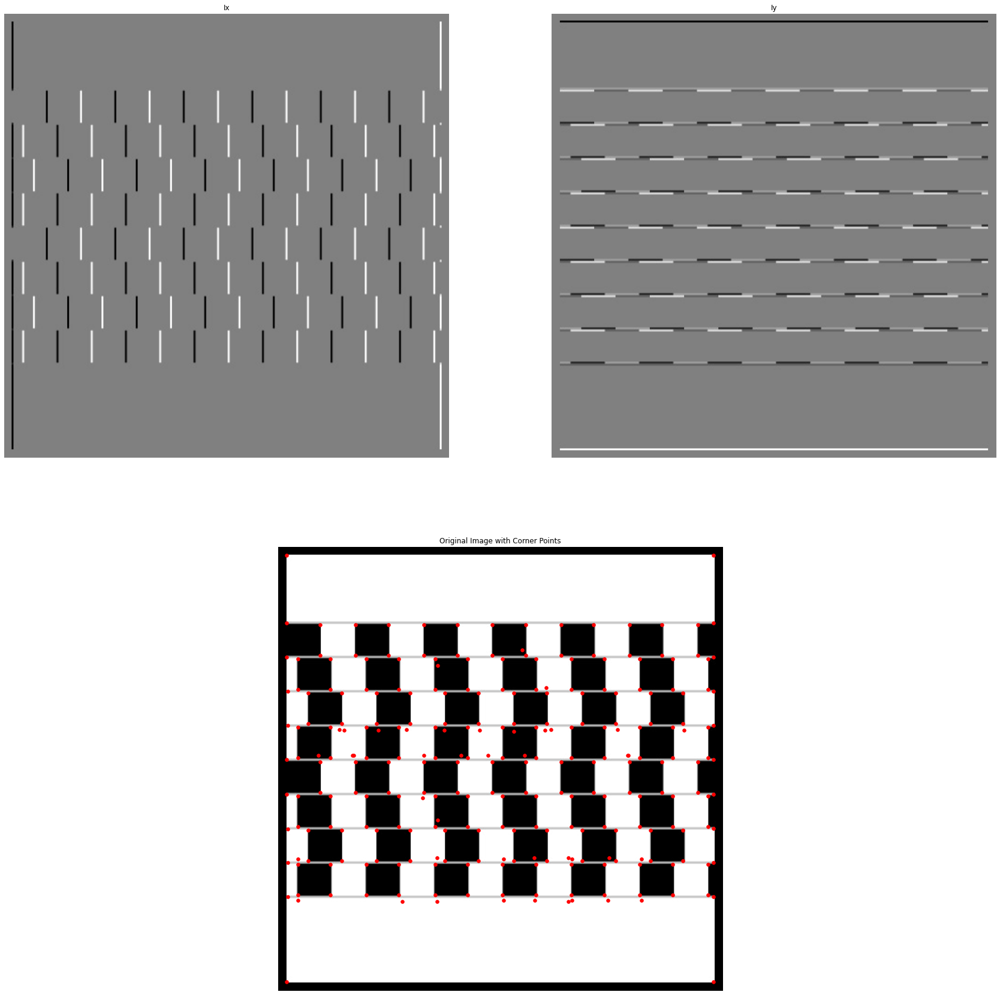

In [5]:
plotter(img_path_checkerboard, 1, 10, smoothing = False)

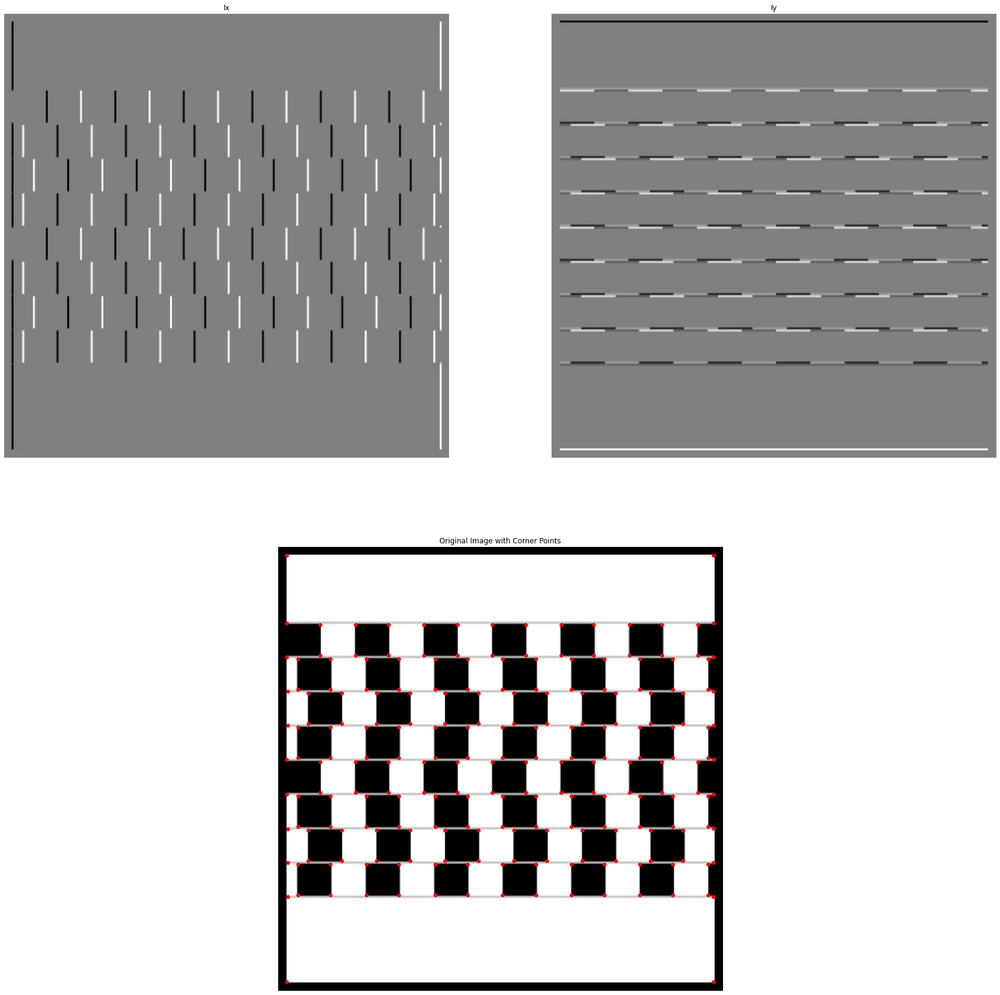

In [6]:
plotter(img_path_checkerboard, 1, 600000, smoothing = False)

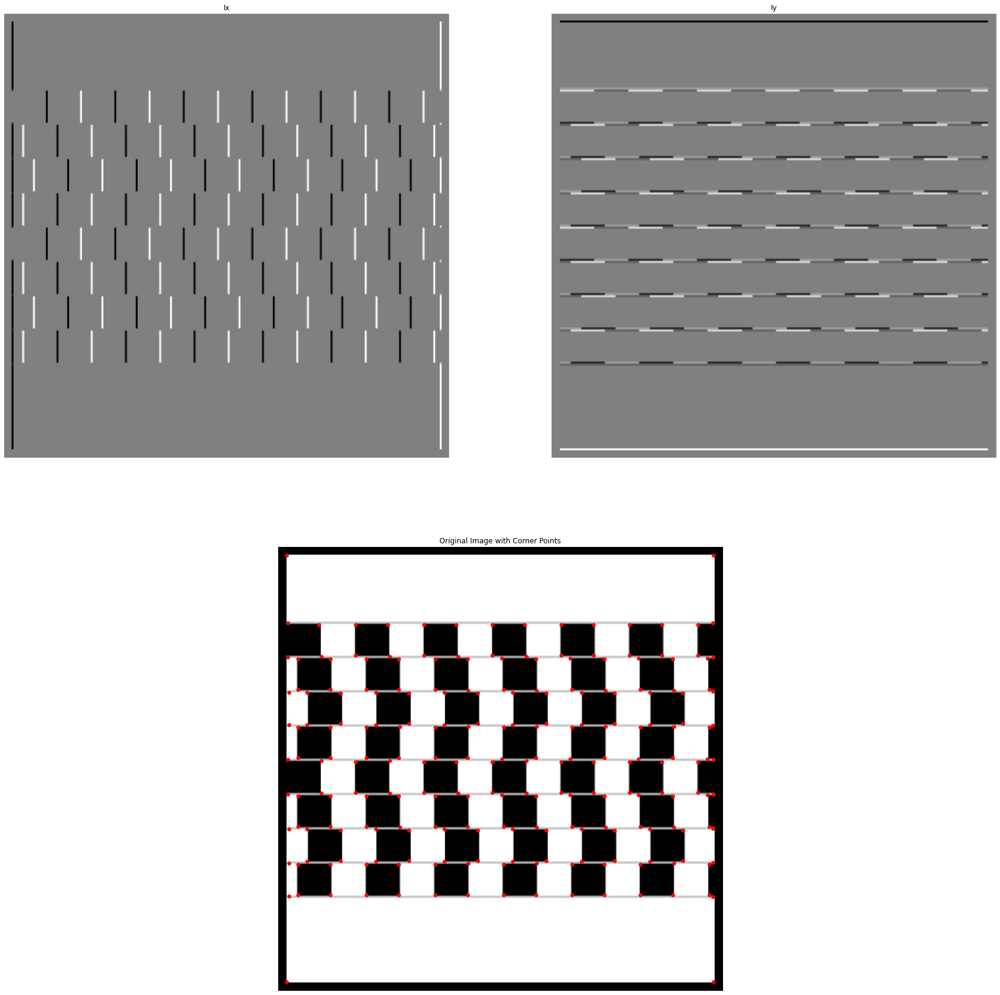

In [7]:
plotter(img_path_checkerboard, 1, 10, smoothing = True)

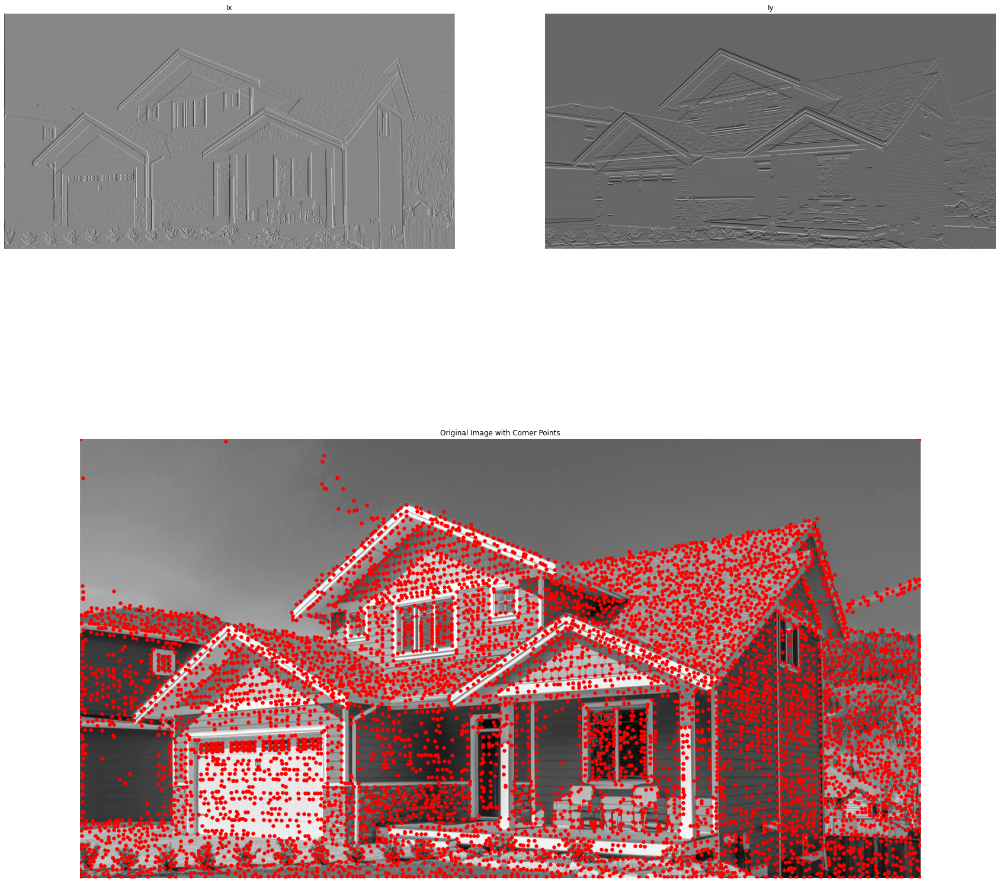

In [8]:
plotter(img_path_house, 1, 10, smoothing = False)

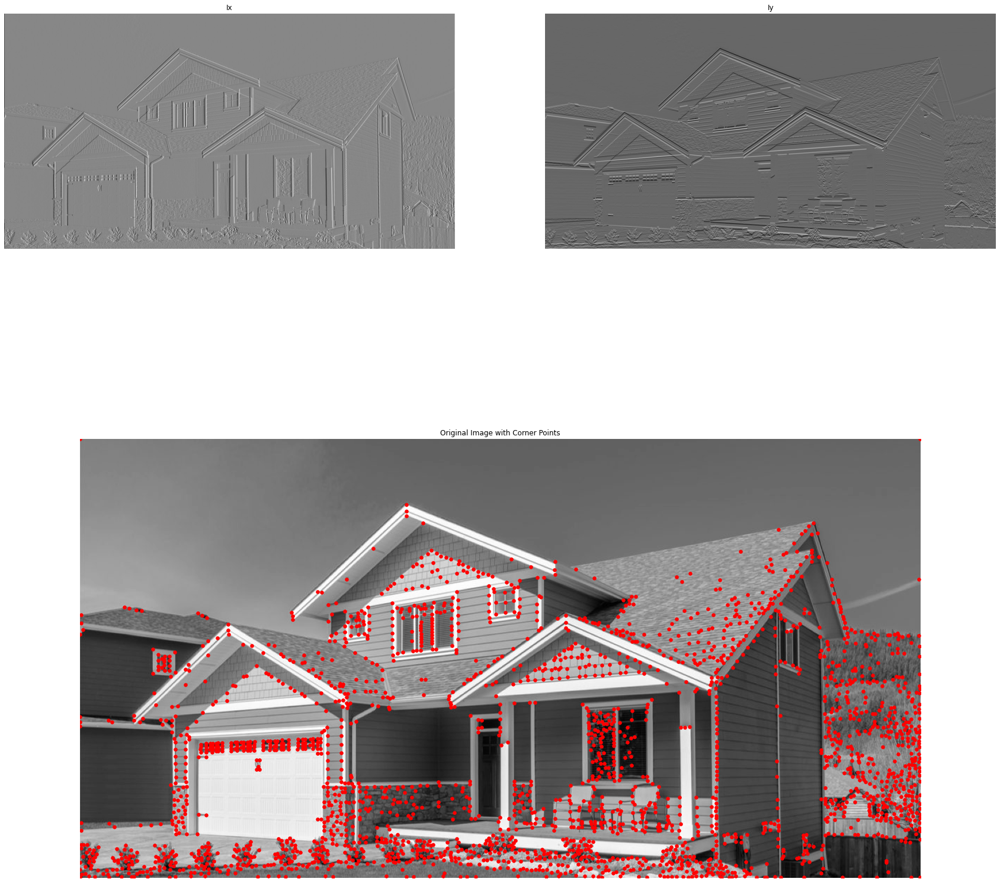

In [9]:
plotter(img_path_house, 1, 100000, smoothing = False)

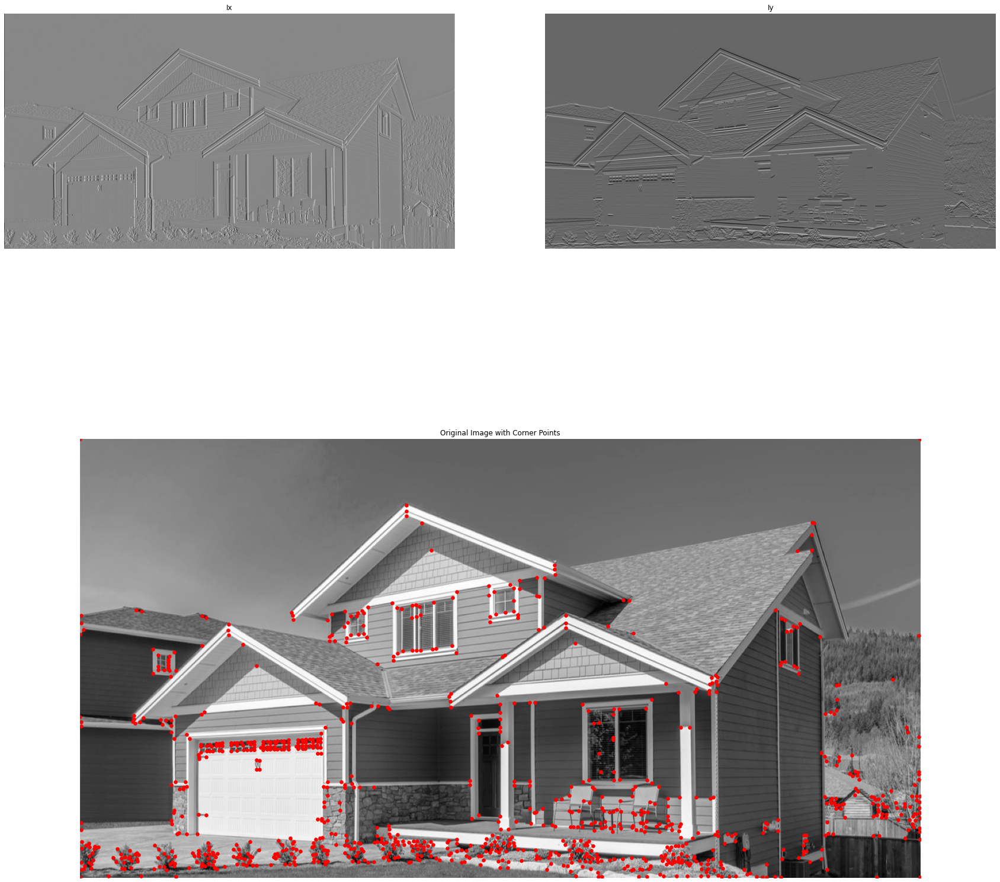

In [10]:
plotter(img_path_house, 1, 100000, smoothing = True)

### Answer to 1.1.3
The algorithm is rotation invariant. It relies on the properties of the matrix Q and its eigenvalues, which are used to compute the cornerness score H. The eigenvalues $\lambda_1$ and $\lambda_2$ of H represent the intensity of the image gradients in two orthogonal directions. Since the eigenvalues are intrinsic properties of the image gradients, they are not affected by the orientation of image itself. Since our implementation stems from the algorithm itself, we have reasons to believe that it will behave accordingly.

##### Rotate **checkerboard.jpg** image 45 and 90 degrees and run the Harris Corner Detector algorithm on the rotated images. Explain your answer and support it with your observations.

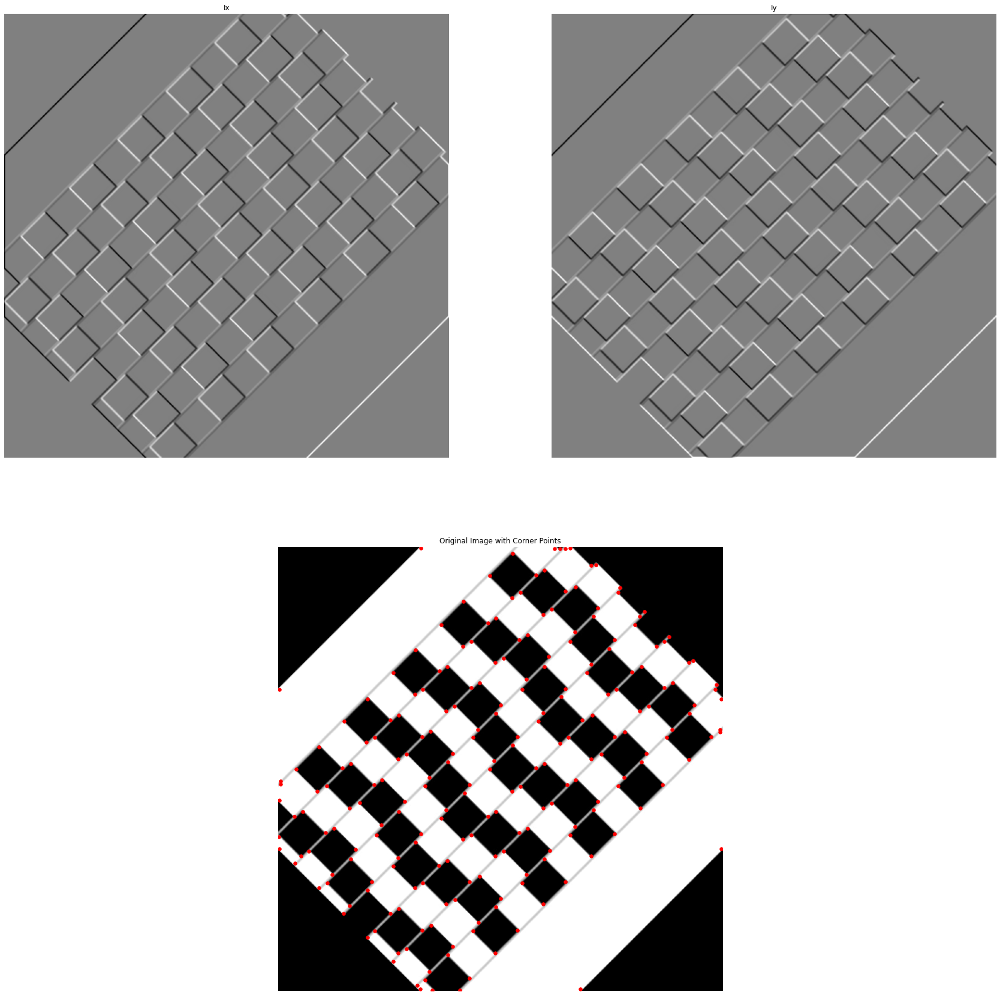

In [11]:
plotter(img_path_checkerboard, 1, 10, True, (True, 45))

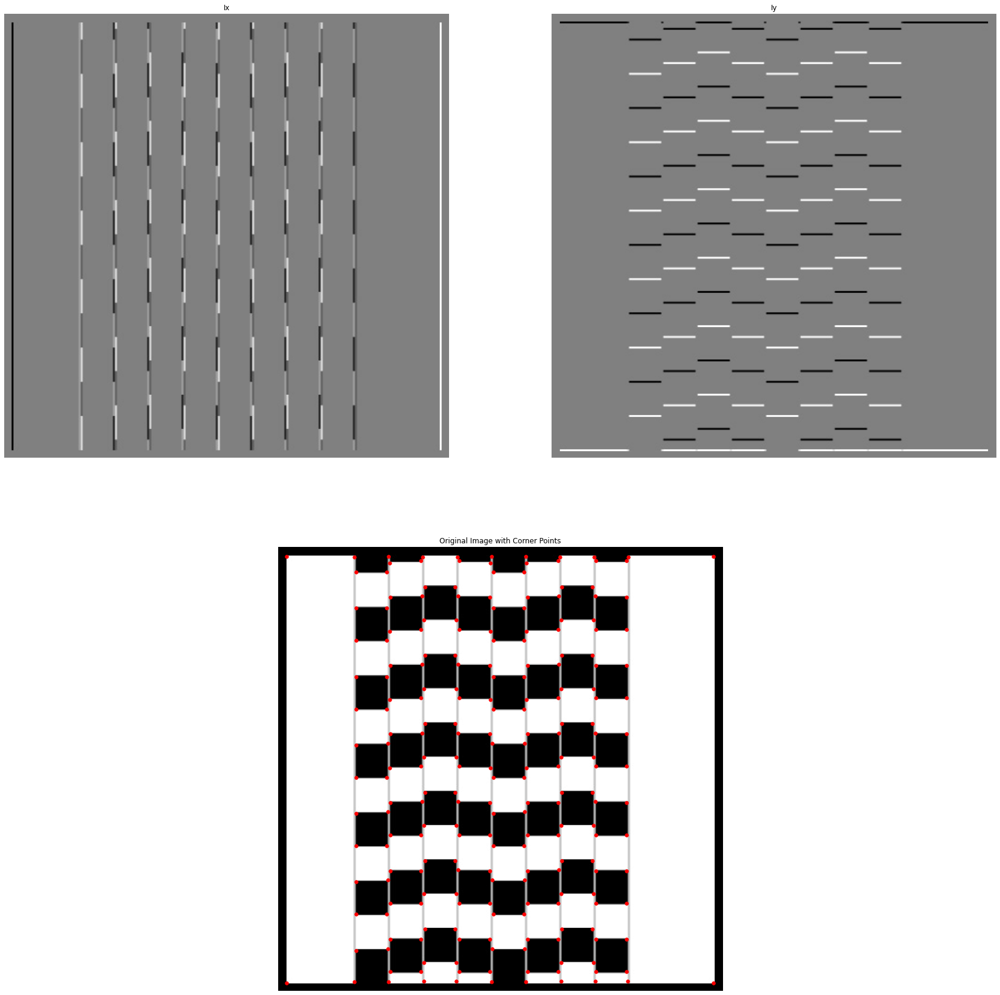

In [12]:
plotter(img_path_checkerboard, 1, 10, True, (True, 90))

The 90 degrees Checkerboard coincides with the original one. The 45 degree one has some slight differences due to the fact that the image is cropped to fit the original aspect ratio, so "new" corners are detected at the borders of the image. Nonetheless, the edges of the checkerboard itself did not vary.

## Question 1.2 (10-*pts*)
    
Now you have seen the cornerness definition of Harris on $Equation ~(12)$. Another relevant definition of cornerness is defined by  *[Shi and Tomasi](https://ieeexplore.ieee.org/document/323794)*, after the original definition of Harris. Check their algorithm and answer the following questions:
    
**1.2.1** How do they define cornerness? Write down their definition using the notations of $Equation ~(12)$. **[3pts]**
    

$$
    H = min(\lambda_1, \lambda_2) \\
    = min(AC - B^2, A + C)
$$

**1.2.2** Does the Shi-Tomasi Corner Detector satisfy the following properties: translation invariance, rotation invariance, scale invariance? Explain your reasoning for each property. **[4pts]**
    

- **Translation invariance**: The algorithm computes the eigenvalues of H. This computation is local to each point and does not depend on the point's position in the image. Therefore, if an object (and its corners) is translated within an image, the Shi-Tomasi algorithm will still identify the corners at the new positions.

- **Rotation invariance**: The eigenvalues of H describe the magnitude of the gradient in two orthogonal directions. These values are invariant to the rotation of the coordinate system, meaning that rotating the image will not change the eigenvalues for a corner. Therefore, the algorithm will still identify the corners even if the object is rotated.

- **Scale invariance**: The algorithm operates at a fixed scale defined by the size of the window used to compute the matrix H. If an object is resized, the corner features may not be detected at the new scale, especially if the scaling is significant in one of the two directions (stretching).

**1.2.3** In the following scenarios, what could be the relative cornerness values assigned by Shi and Tomasi? Explain your reasoning. **[3pts]**

1. Both eigenvalues are near 0.
    
2. One eigenvalue is big and the other is near zero.
    
3. Both eigenvalues are big.

1. In this case, both $\lambda_1$ and $\lambda_2$ are are close to zero. Since the Shi-Tomasi corner response function takes the minimum of the two eigenvalues, H will be close to 0 too. Eigenvalues near zero indicate that there is little to no gradient in either of the orthogonal directions at that point. This usually corresponds to a flat region in the image, such as a smooth surface or a uniform background. Corners are characterized by significant gradients in multiple directions, so a low H value is consistent with the absence of a corner.

2. In this case, H will be close to zero, because one of the eigenvalues is near zero. A large eigenvalue combined with a small eigenvalue usually indicates the presence of an edge rather than a corner. The large eigenvalue signifies a strong gradient in one direction, while the small eigenvalue indicates little to no gradient in the orthogonal direction. This is typical of an edge, where there is a transition between two regions (orthogonally to the edge) along one direction but none along the orthogonal (along the edge) direction.

3. In this case, both $\lambda_1$ and $\lambda_2$ are large, so H will also be large. Large eigenvalues in both orthogonal directions indicate strong gradients, which is a hallmark of a corner. In a corner, we expect to see significant changes in intensity in multiple directions, and this is reflected in the large eigenvalues. Therefore, a high 
�
R value in this scenario is indicative of a corner.



# 2. Optical Flow - Lucas-Kanade Algorithm (35pts)

Optical flow is the apparent motion of image pixels or regions from one frame to the next, which results from moving objects in the image or from camera motion. Underlying optical flow is typically an assumption of $\textit{brightness constancy}$. That is the image values (brightness, color, etc) remain constant over time, though their 2D position in the image may change. Algorithms for estimating optical flow exploit this assumption in various ways to compute a velocity field that describes the horizontal and vertical motion of every pixel in the image. For a 2D+t dimensional case a voxel at location $(x, y, t)$ with intensity $I(x, y, t)$ will have moved by $\delta_x$, $\delta_y$ and $\delta_t$ between the two image frames, and the following image constraint equation can be given:

\begin{equation}
I(x,y,t) = I(x+\delta_x, y+\delta_y, t+\delta_t). \tag{15}
\end{equation}

Assuming the movement to be small, the image constraint at I(x, y, t) can be extended using Taylor series, truncated to first-order terms:

\begin{equation}
\tag{16}
I(x+\delta_x, y+\delta_y, t+\delta_t) = I(x,y,t)+\frac{\partial I}{\partial x}\delta_x +\frac{\partial I}{\partial y}\delta_y+\frac{\partial I}{\partial t}\delta_t
\end{equation}

Since we assume changes in the image can purely be attributed to movement, we will get:

\begin{equation}
\tag{17}
\frac{\partial I}{\partial x}\frac{\delta_x}{\delta_t} +   \frac{\partial I}{\partial y}\frac{\delta_y}{\delta_t} + \frac{\partial I}{\partial t}\frac{\delta_t}{\delta_t} = 0
\end{equation}

or

\begin{equation}
\tag{18}
I_x V_x + I_y V_y = -I_t,
\end{equation}

where $V_x$ and $V_y$ are the $x$ and $y$ components of the velocity or optical flow of $I(x,y,t)$. Further, $I_x$, $I_y$ and $I_t$ are the derivatives of the image at $(x, y, t)$ in the corresponding directions, which defines the main equation of optical flow.

Optical flow is difficult to compute for two main reasons. First, in image regions that are roughly homogeneous, the optical flow is ambiguous, because the brightness constancy assumption is satisfied by many different motions. Second, in real scenes, the assumption is violated at motion boundaries and by miscellaneous lighting, non-rigid motions, shadows, transparency, reflections, etc. To address the former, all optical flow methods make some sort of assumption about the spatial variation of the optical flow that is used to resolve the ambiguity. Those are just assumptions about the world which are approximate and consequently may lead to errors in the flow estimates. The latter problem can be addressed by making much richer but more complicated assumptions about the changing image brightness or, more commonly, using robust statistical methods which can deal with 'violations' of the brightness constancy assumption.

## Lucas-Kanade Algorithm

We will be implementing the [Lucas-Kanade method](https://www.ri.cmu.edu/pub_files/pub3/lucas_bruce_d_1981_2/lucas_bruce_d_1981_2.pdf) for Optical Flow estimation. This method assumes that the optical flow is essentially constant in a local neighborhood of the pixel under consideration. Therefore, the main equation of the optical flow can be assumed to hold for all pixels within a window centered at the pixel under consideration. Let's consider pixel $p$. Then, for all pixels around $p$, the local image flow vector $(V_x, V_y)$ must satisfy:

\begin{array}{c}
\tag{19}
  I_x(q_1)V_x + I_y(q_1)V_y = - I_t(q_1)\\
  I_x(q_2)V_x + I_y(q_2)V_y = - I_t(q_2)\\
  \vdots \\
  I_x(q_n)V_x + I_y(q_n)V_y = - I_t(q_n),\\
\end{array}

where $q_1$, $q_2$, ... $q_n$ are the pixels inside the window around $p$. $I_x(q_i)$, $I_y(q_i)$, $I_t(q_i)$ are the partial derivatives of the image $I$ with respect to position $x$, $y$ and time $t$, evaluated at the point $q_i$ and at the current time.

These equations can be written in matrix to form $Av=b$, where

$$
\tag{20}
A = \begin{bmatrix}
I_x(q_1) & I_y(q_1)\\
I_x(q_2) & I_y(q_2)\\
\vdots   & \vdots  \\
I_x(q_n) & I_y(q_n)
\end{bmatrix},
v = \begin{bmatrix}
V_x\\ V_y
\end{bmatrix}
$$
and
$$
b = \begin{bmatrix}
-I_t(q_1)\\
-I_t(q_2)\\
\vdots   \\
-I_t(q_n)
\end{bmatrix}.
$$

This system has more equations than unknowns and thus it is usually over-determined. The Lucas-Kanade method obtains a compromise solution by the weighted-least-squares principle. Namely, it solves the $2\times 2$ system as

\begin{equation}
\tag{21}
A^T A v = A^T b
\end{equation}

or

\begin{equation}
v = (A^T A)^{-1} A^T b.
\end{equation}

## Question 2.1 (30-*pts*)
    
For this assignment, you will be given three pairs of images: **sphere1.ppm**, **sphere2.ppm**; **car1.jpg**, **car2.jpg**; and **plant1.png**, **plant2.png**. You should estimate the optical flow between these two pairs. That is, you will get optical flow for sphere images, and for car and plant images separately. Implement the Lucas-Kanade algorithm using the following steps.

    
1. Divide  input  images  on  non-overlapping  regions,  each  region  being  $20\times 20$.
    
    
2. For each region compute $A$, $A^T$ and $b$. Then, estimate optical flow as given in Equation 22.
    
    
3. When you have estimation for optical flow $(V_x, V_y)$ of each region, you should display the results. There is a **matplotlib** function `quiver` which plots a set of two-dimensional vectors as arrows on the screen. Try to figure out how to use this to show your optical flow results.

<em>Note</em>: You are allowed to use `scipy.signal.convolve2d` to perform convolution.
Include a demo function to run your code.

**Hint**: You can use regions that are $20\times 20$ pixels that are non-overlapping. That is, if input images are $256\times 256$, you should have an array of $12\times 12$ optical flow vectors at the end of your procedure. As we consider $20\times 20$ regions, your matrix $\textbf{A}$ will have the following size $400\times 2$, and the vector $\mathbf{b}$ will be $400\times 1$.

**Hint**: Carefully read the documentation of **matplotlib**'s function `quiver`. By default, the angles of the arrows are 45 degrees counter-clockwise from the horizontal axis. This means your arrows might point in the wrong direction! Also, play around with the arrow scaling.

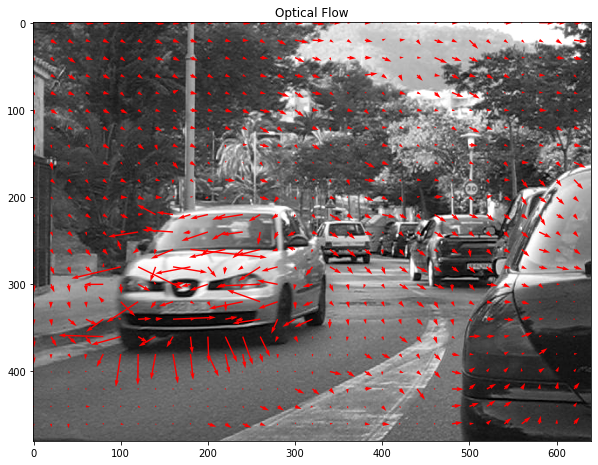

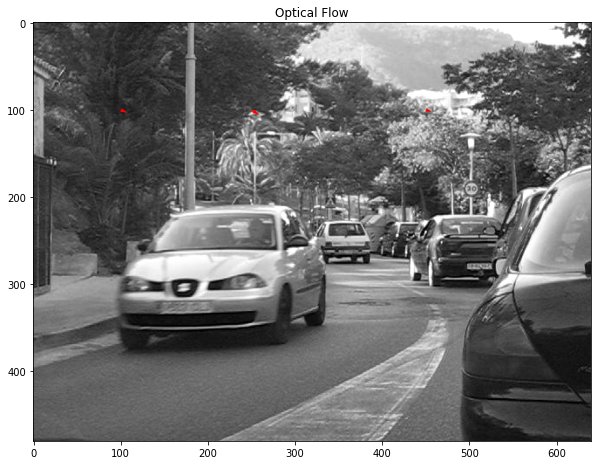

In [13]:
def load_images(name_image_t0, name_image_t1, image_dir="./data/"):
    # Load the two images
    I_t0 = cv2.imread(image_dir + name_image_t0, 0)
    I_t1 = cv2.imread(image_dir + name_image_t1, 0)

    # Convert the to np.float32
    I_t0 = I_t0.astype(np.float32)
    I_t1 = I_t1.astype(np.float32)

    return I_t0, I_t1

def calculate_derivatives(I_t0, I_t1):
    """
    Obtain x, y and time derivatives of an image.
    """
    kernel_x = np.array([[-1, 1], [-1, 1]])
    kernel_y = np.array([[-1, -1], [1, 1]])
    kernel_t = np.array([[1, 1], [1, 1]])
    
    I_x = signal.convolve2d(I_t0, kernel_x)
    I_y = signal.convolve2d(I_t0, kernel_y)
    I_t = signal.convolve2d(I_t1, kernel_t) - signal.convolve2d(I_t0, kernel_t)
    
    return I_x, I_y, I_t
    

# Function that separates the image into subregions
def calculate_subregions(I_t0, I_x, I_y, I_t, region_size):
    """
    input: I_t0, I_x, I_y, I_t, region_size
    I_t0: image at time t0
    I_x: image x-derivative
    I_y: image y-derivative
    I_t: image time derivative
    region_size: size of the subregions

    output: sub_I_x, sub_I_y, sub_I_t
    sub_I_x: subregions of the image x-derivative
    sub_I_y: subregions of the image y-derivative
    sub_I_t: subregions of the image time derivative
    """
    height, width = I_t0.shape
    num_regions_x = width // region_size
    num_regions_y = height // region_size
    
    dim_x = num_regions_x * region_size
    dim_y = num_regions_y * region_size
    
    sub_I_x = np.zeros((dim_y, dim_x))
    sub_I_y = np.zeros((dim_y, dim_x))
    sub_I_t = np.zeros((dim_y, dim_x))
    
    subregion_indices = []
    sub_I_x = []
    sub_I_y = []
    sub_I_t = []

    for i in range(num_regions_y):
        for j in range(num_regions_x):
            begin_y = i * region_size
            end_y = begin_y + region_size
            begin_x = j * region_size
            end_x = begin_x + region_size
            
            subregion_indices.append(begin_x)
            subregion_indices.append(begin_y)

            sub_I_x.append(I_x[begin_y:end_y, begin_x:end_x])
            sub_I_y.append(I_y[begin_y:end_y, begin_x:end_x])
            sub_I_t.append(I_t[begin_y:end_y, begin_x:end_x])

    return np.array(sub_I_x), np.array(sub_I_y), np.array(sub_I_t), np.array(subregion_indices)

# Function that calulates subregions given corners
def calculate_subregions_for_corners(I_x, I_y, I_t, r, c, region_size):
    """
    Input: I_x, I_y, I_t, r, c, region_size
    I_x, I_y, I_t: image derivatives
    r, c: corners of the subregions
    region_size: size of the subregions

    Output: sub_I_x, sub_I_y, sub_I_t
    sub_I_x, sub_I_y, sub_I_t: subregions of the image derivatives
    """
    
    dim_x = len(r) * region_size
    dim_y = len(r) * region_size
    sub_I_x = np.zeros((dim_y, dim_x))
    sub_I_y = np.zeros((dim_y, dim_x))
    sub_I_t = np.zeros((dim_y, dim_x))

    subregion_indices = []
    sub_I_x = []
    sub_I_y = []
    sub_I_t = []
    
    for row, column in zip(r, c):
        if row< int(0.5 * region_size) or column < int(0.5 * region_size):
            continue
        begin_y = row - int(0.5 * region_size)
        end_y = row + int(0.5 * region_size)
        begin_x = column - int(0.5 * region_size)
        end_x = column + int(0.5 * region_size)
        
        subregion_indices.append(column)
        subregion_indices.append(row)

        sub_I_x.append(I_x[begin_y:end_y, begin_x:end_x])
        sub_I_y.append(I_y[begin_y:end_y, begin_x:end_x])
        sub_I_t.append(I_t[begin_y:end_y, begin_x:end_x])
    
    return np.array(sub_I_x), np.array(sub_I_y), np.array(sub_I_t), np.array(subregion_indices)



# Function that computes A, A.T and b for each subregion. Then, estimate
# optical flow (Vx, Vt) as given in Equation 22.
def calculate_flow_vectors(I_x, I_y, I_t):
    """
    Calculate the local image flow vector (Vx, Vy) for each subregion by
    solving the linear system defined above.

    Input: I_x, I_y, I_t
    I_x, I_y, I_t: image derivatives

    Output: Vx, Vy
    Vx, Vy: Two lists containing, respectively, Vx, Vy of each subregion
    """
    Vx = []
    Vy = []
    A = np.vstack((I_x.flatten(), I_y.flatten())).T
    b = -I_t.flatten()
    v = np.linalg.pinv(A.T @ A) @ A.T @ b
    Vx.append(- v[0])
    Vy.append(- v[1])

    return Vx, Vy


# Function that plots the optical flow vectors
def plot_optical_flow(subregion_indices, V_x, V_y, I_t0):
    """
    Input: subregion_indices, V_x, V_y
    subregion_indices: indices of the subregions
    V_x, V_y: optical flow vectors
    """
    plt.figure(figsize=(10, 8))
    plt.quiver(subregion_indices[::2], subregion_indices[1::2], V_x, V_y, color='r', angles='xy', scale_units='xy', scale=0.15, width=0.0025)
    plt.title('Optical Flow')
    
    plt.imshow(I_t0, cmap='gray')
    plt.show()


    
# Add the remainder of your code here. If needed, feel free to define more functions.

def optical_flow(image_1, image_2, region_size):
    I_t0, I_t1 = image_1, image_2
    I_x, I_y, I_t = calculate_derivatives(I_t0, I_t1)
    sub_I_x, sub_I_y, sub_I_t, subregion_indices = calculate_subregions(I_t0, I_x, I_y, I_t, region_size)

    V_x = []
    V_y = []
    for sIx, sIy, sIt in zip(sub_I_x, sub_I_y, sub_I_t):
        Vx, Vy = calculate_flow_vectors(sIx, sIy, sIt)
        V_x.append(Vx[0])
        V_y.append(Vy[0])
    return subregion_indices, V_x, V_y, I_t0


# makes use of calculate_subregions_for_corners() for question 3.1 
# Assuming here: r is the upperleft corner and c the rightbottom corner
def optical_flow_for_corners(image_1, image_2, r, c, region_size):
    I_t0, I_t1 = image_1, image_2
    
    I_x, I_y, I_t = calculate_derivatives(I_t0, I_t1)
    sub_I_x, sub_I_y, sub_I_t, subregion_indices = calculate_subregions_for_corners(I_x, I_y, I_t, r, c, region_size)

    V_x = []
    V_y = []
    for sIx, sIy, sIt in zip(sub_I_x, sub_I_y, sub_I_t):
        Vx, Vy = calculate_flow_vectors(sIx, sIy, sIt)
        V_x.append(Vx[0])
        V_y.append(Vy[0])
    return subregion_indices, V_x, V_y, I_t0


# example with optical_flow()
region_size = 20
image_1_name = "car1.jpg"
image_2_name = "car2.jpg"

image_1, image_2 = load_images(image_1_name, image_2_name, image_dir="./data/")

subregion_indices, V_x, V_y, I_t0 = optical_flow(image_1, image_2, region_size)
plot_optical_flow(subregion_indices, V_x, V_y, I_t0)

# example with optical_flow_for_corners()
r = [100, 100, 100]
c = [100, 250, 450]

subregion_indices, V_x, V_y, I_t0 = optical_flow_for_corners(image_1, image_2, r, c, region_size)
plot_optical_flow(subregion_indices, V_x, V_y, I_t0)


## Question 2.2 (5-*pts*)

Now you have seen one of the optical flow estimation methods developed by Lucas and Kanade. There are several more methods in the literature. The *[Horn-Schunck method](https://www.sciencedirect.com/science/article/abs/pii/0004370281900242)* is one of them. Check their method, compare it to Lucas-Kanade and answer the following questions:

**2.2.1** At what scale do the algorithms operate; i.e local or global? Explain your answer.

The Lucas Kanade method assumes that the flow is essentially constant in a local neighbourhood of the pixel and therefore solves the optical flow equations for all the pixels in that neighbourhood. This means that the Lucas Kanade algorithm operates locally.
(source: https://en.wikipedia.org/wiki/Lucas%E2%80%93Kanade_method)

The Horn-Schunck method assumes smoothness in the flow over the whole image and therefore tries to minimize distortions in flow over the entire image. The flow is formulated as a global energy functional which is then sought to be minimized. This means that the Horn-Schunck algorithm operates globally.

(source: https://en.wikipedia.org/wiki/Horn%E2%80%93Schunck_method)


**2.2.2** How do the algorithms behave at flat regions? Explain differences/similarities.

We assume that all intensity changes can be explained by intensity gradients, this means that the method breaks down on flat surfaces when the gradients are negligible (≈0). The Lucas-Kanade algorithm eliminates regions without structure by looking at the invertibilily of the matrix S.T @ S in an indirect way (i.e. through the eigenvalues of this matrix).

(source: http://www.inf.fu-berlin.de/inst/ag-ki/rojas_home/documents/tutorials/Lucas-Kanade2.pdf)


The Horn-Schunck method introduces a smoothness weight α > 0 which serves as regularisation parameter. On flat surfaces when the gradients are negligible (≈0), the Horn-Schunck method has the regulariser that fills in information from the neighbourhood. This results in dense flow fields and makes subsequent interpolation steps obsolete.

(source: https://www.mia.uni-saarland.de/Publications/bruhn-ijcv05c.pdf)

# 3. Feature Tracking (20-pts)

In this part of the assignment, you will implement a simple feature-tracking algorithm. The aim is to extract visual features, like corners, and track them over multiple frames.

## Question 3.1 (18-*pts*)

**3.1.1** Implement a simple feature-tracking algorithm by following below steps **[12pts]**:
    
1. Locate feature points on the first frame by using the Harris Corner Detector, that you implemented in Section 1.

2. Track these points using the Lucas-Kanade algorithm for optical flow estimation, that you implemented in the Section 2.
    
    
**3.1.2** Prepare a video for each sample image sequences. These videos should visualize the initial feature points and the optical flow. Test your implementation and prepare visualization videos for **basketball** and **toy** samples. **[6pts]**

Include a demo function to run your code.

In [14]:
# --------------
# YOUR CODE HERE
# --------------

from typing import Callable, List, Dict


class FeatureTracker:
    def __init__(self, corner_detector: Callable, optical_flow_algorithm: Callable, params: Dict) -> None:
        self.corner_detector = corner_detector
        self.optical_flow_algorithm = optical_flow_algorithm
        self.sigma = params['corner_detection_sigma']
        self.threshold = params['corner_detection_threshold']
        self.smoothing = params['corner_detection_smoothing']
        self.region_size = params['optical_flow_region_size']
    
    def load_gray_img(self, img_path: str):
        img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img_gray_float_32 = img_gray.astype(np.float32)
        return img_gray_float_32

    def get_image_paths_from_dir(self, 
                                 dir_path: str
                                 ) -> List:
        img_paths = [os.path.join(dir_path, img_name) for img_name in os.listdir(dir_path) if img_name.endswith(".jpg")]
        img_paths.sort()

        return img_paths
    
    def detect_corners(self,
                       img_path: str,
                       sigma: int,
                       threshold: int,
                       smoothing: bool=False
                       ):
        _, rows, columns = self.corner_detector(img_path, sigma=sigma, threshold=threshold, smoothing=smoothing)
        # rows - the indices of rows of the detected corner points
        # columns - indices of columns of the detected corner points
        return rows, columns
    
    def optical_flow(self, 
                     image_1: np.ndarray,
                     image_2: np.ndarray,
                     point_rows: List,
                     point_columns: List,
                     region_size: int
                     ) -> tuple:
        subregion_indices, V_x, V_y, I_t0 = self.optical_flow_algorithm(image_1, image_2, point_rows, point_columns, region_size)
        return subregion_indices, V_x, V_y, I_t0

    def run(self, 
            image_dir: str, 
            num_frames: int=None, 
            visualize_optical_flow: bool=False,
            save_output_video: bool=False
            )-> None:
        img_paths = self.get_image_paths_from_dir(image_dir)
        
        if num_frames is not None:
            img_paths = img_paths[:num_frames]
        else:
            num_frames = len(img_paths)
        
        if save_output_video:
            video_writer = cv2.VideoWriter('output.avi', cv2.VideoWriter_fourcc(*'MJPG'), 15, (640, 480))

        # Loop through images
        for img_idx, _ in enumerate(img_paths):
            # print(f'Processing image {img_idx + 1}/{len(img_paths)}')
            if img_idx == (num_frames - 1):
                break

            img_1 = self.load_gray_img(img_paths[img_idx])
            img_2 = self.load_gray_img(img_paths[img_idx + 1])
        
            rows, columns = self.detect_corners(img_1, self.sigma, self.threshold, self.smoothing)
            subregion_indices, V_x, V_y, I_t0 = self.optical_flow(img_1, img_2, rows, columns, self.region_size)
            
            if visualize_optical_flow:
                if img_idx % 5 == 0:
                    plot_optical_flow(subregion_indices, V_x, V_y, I_t0)


### 3.1.1 Feature tracking on 2 frames

In [15]:
params = {
    'corner_detection_sigma': 1,
    'corner_detection_threshold': 20000,
    'corner_detection_smoothing': True,
    'optical_flow_region_size': 20
}

feature_tracker = FeatureTracker(corner_detector=haris_corner_detector, 
                                 optical_flow_algorithm=optical_flow_for_corners, 
                                 params=params)

/Users/Kuba/miniforge3/envs/cv1/lib/python3.6/site-packages/ipykernel_launcher.py:112: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


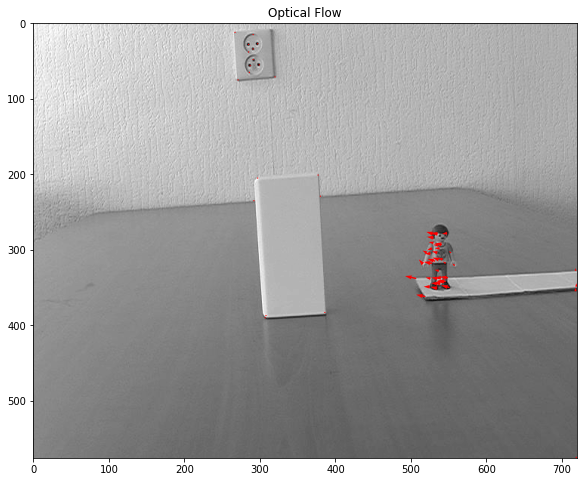

In [16]:
feature_tracker.run(image_dir="./data/toy", num_frames=2, visualize_optical_flow=True)

/Users/Kuba/miniforge3/envs/cv1/lib/python3.6/site-packages/ipykernel_launcher.py:112: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


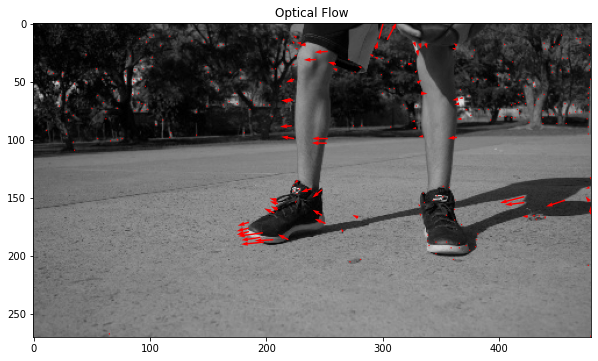

In [17]:
feature_tracker.threshold = 10000

feature_tracker.run(image_dir="./data/basketball", num_frames=2, visualize_optical_flow=True)

### 3.1.2 Feature tracking on a video

As visualizing about 250 frames at once would make the notebook cluttered with images, we decided to visualize every 5 frames of the video. Nonetheless, this can be easily altered by adjusting the code below:


```python
class FeatureTracker:
        def run(...):
        ...
        if visualize_optical_flow:
            if img_idx % VALUE_TO_CHANGE == 0:
                plot_optical_flow(subregion_indices, V_x, V_y, I_t0)
```

- #### Toy

/Users/Kuba/miniforge3/envs/cv1/lib/python3.6/site-packages/ipykernel_launcher.py:112: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


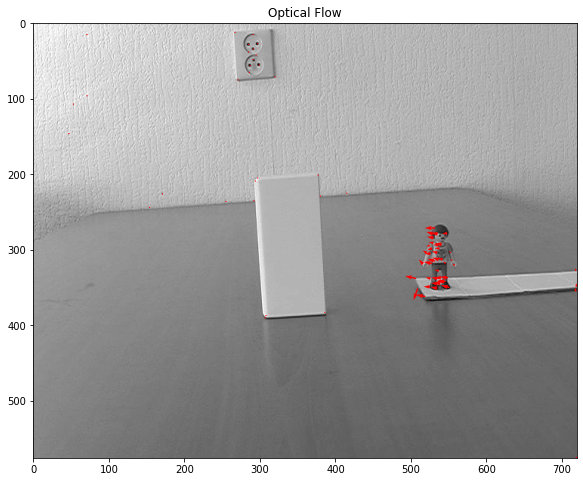

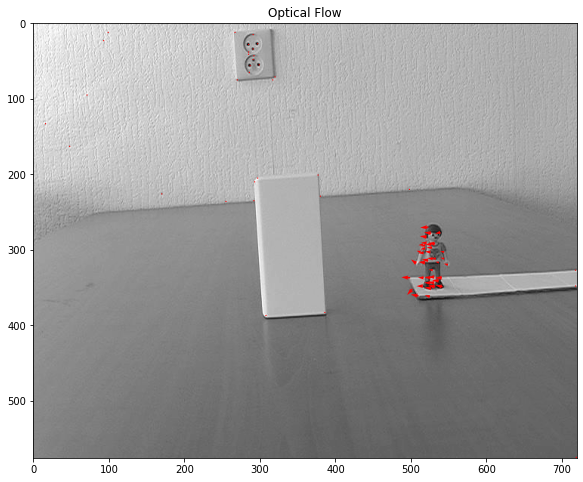

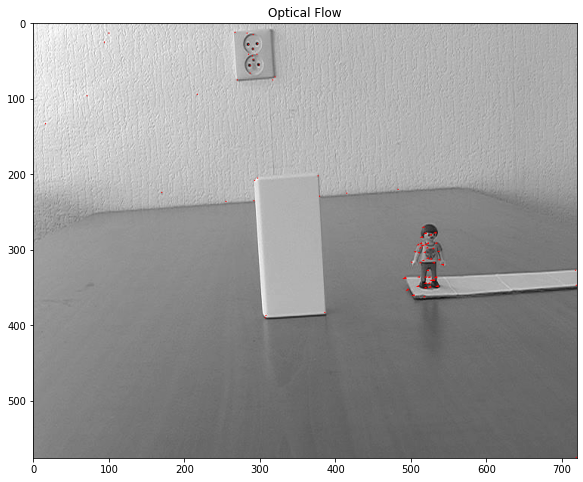

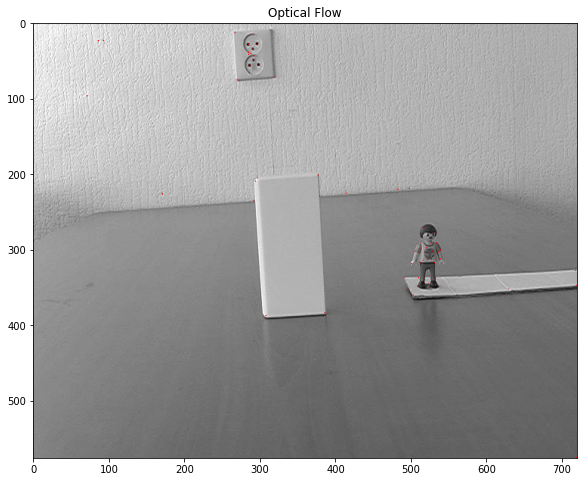

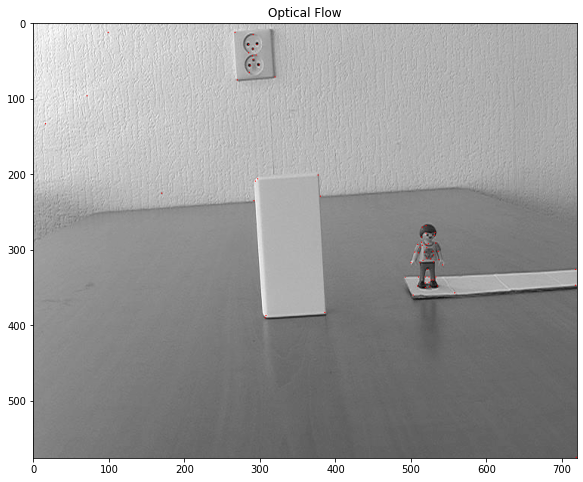

...

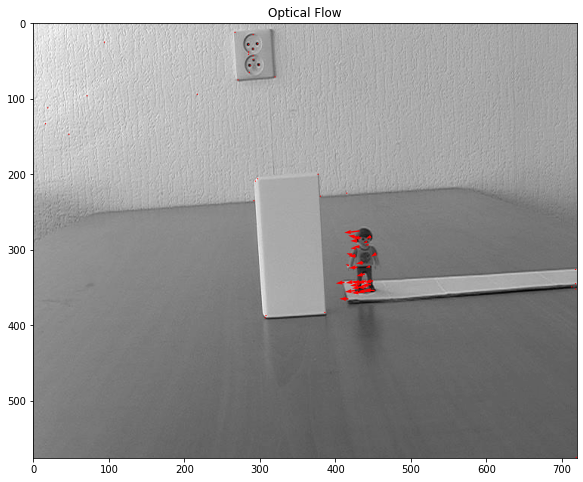

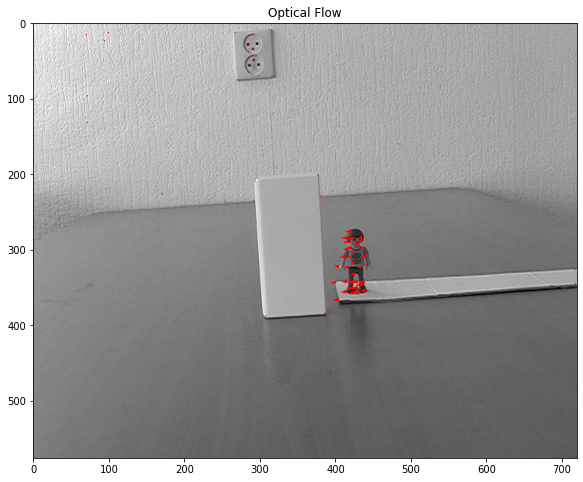

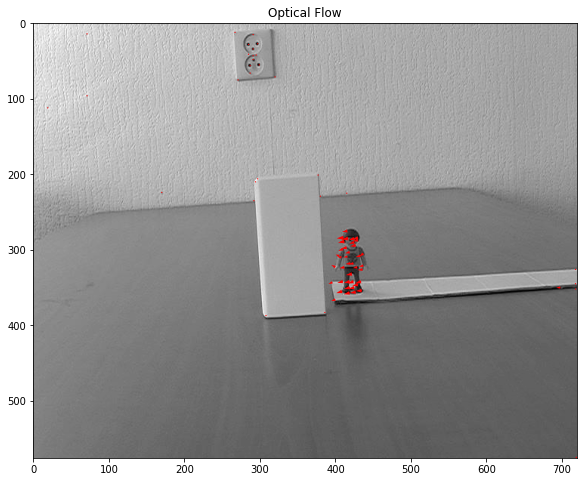

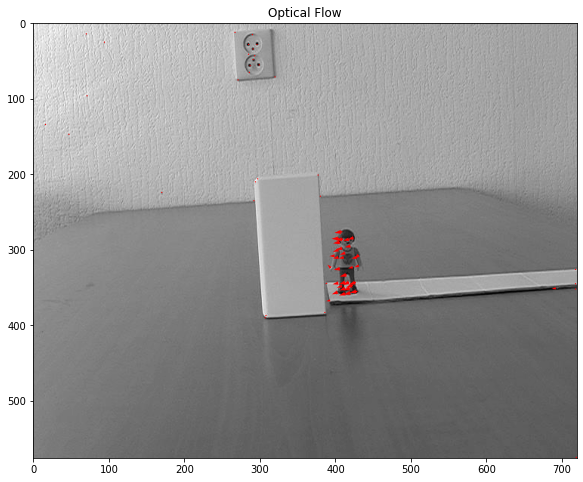

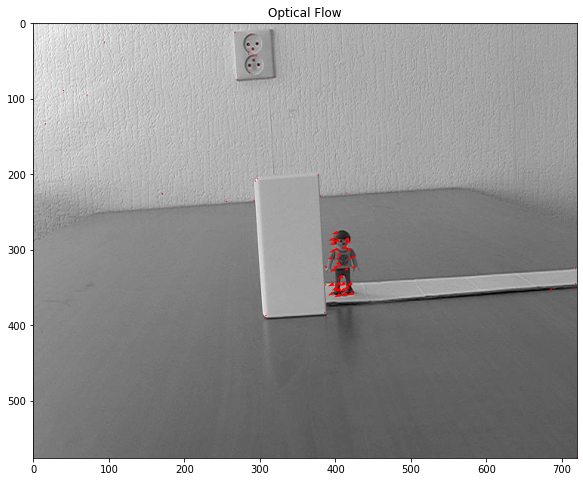

In [18]:
feature_tracker.run(image_dir="./data/toy", visualize_optical_flow=True)

- #### Basketball

In [19]:
params = {
    'corner_detection_sigma': 1,
    'corner_detection_threshold': 10000,
    'corner_detection_smoothing': True,
    'optical_flow_region_size': 20
}

feature_tracker = FeatureTracker(corner_detector=haris_corner_detector, 
                                 optical_flow_algorithm=optical_flow_for_corners, 
                                 params=params)

/Users/Kuba/miniforge3/envs/cv1/lib/python3.6/site-packages/ipykernel_launcher.py:112: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


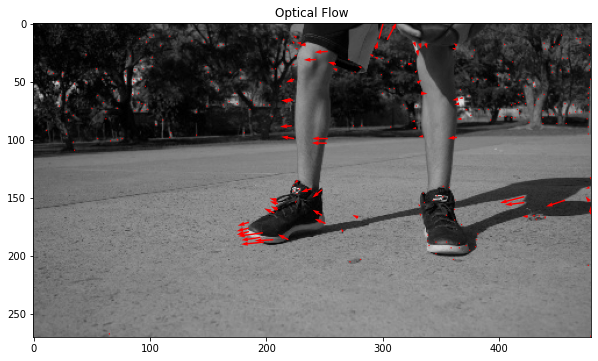

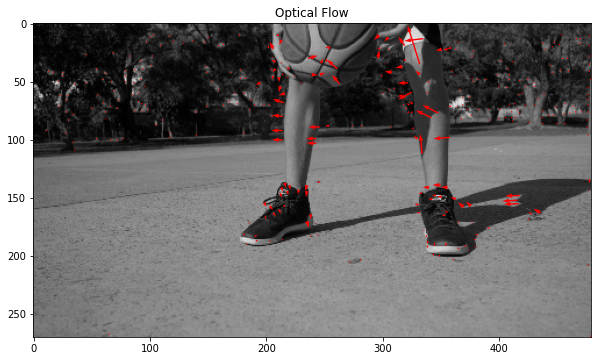

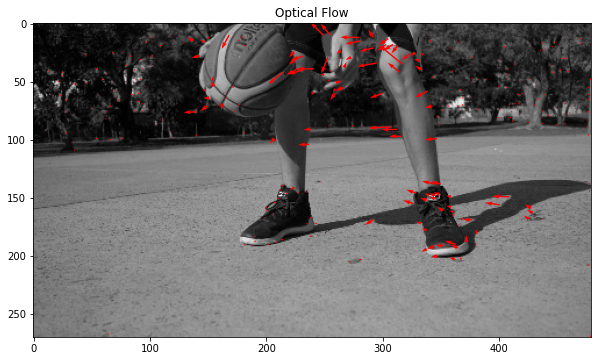

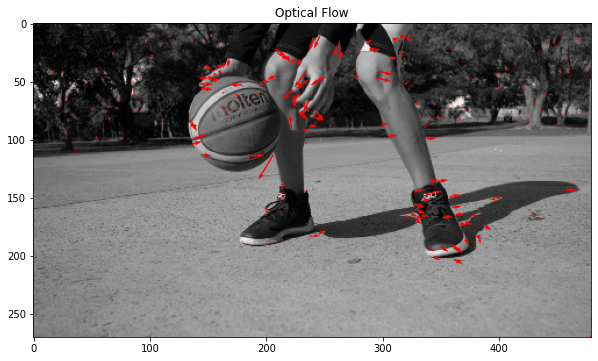

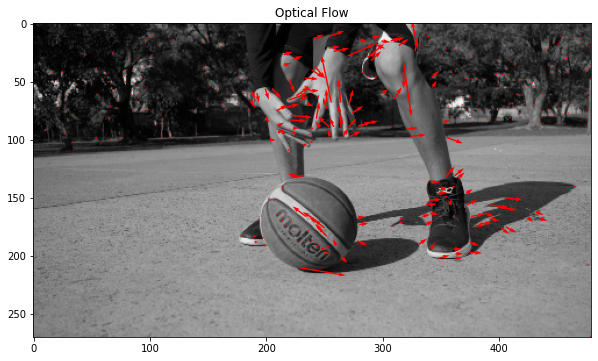

...

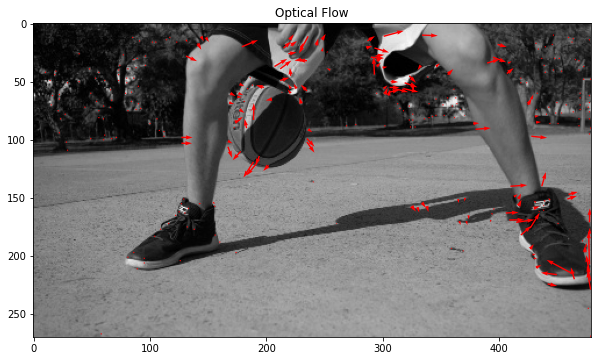

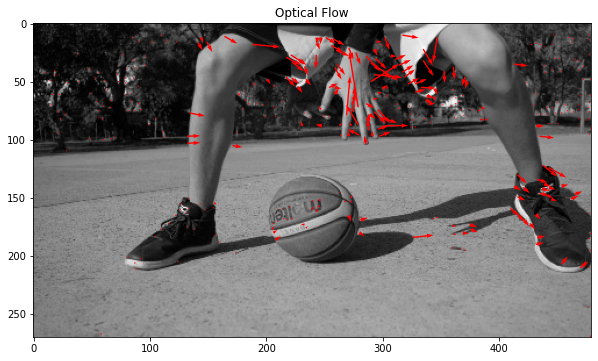

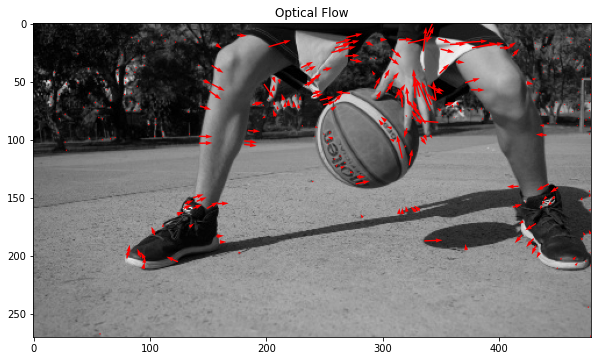

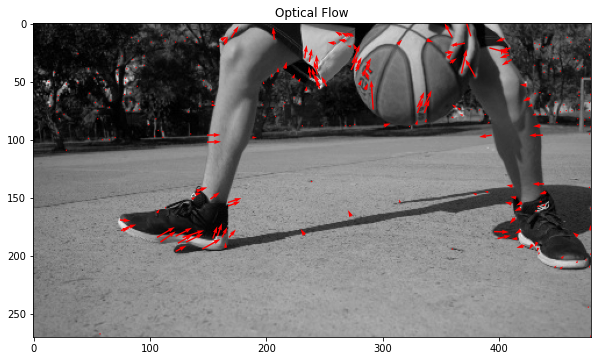

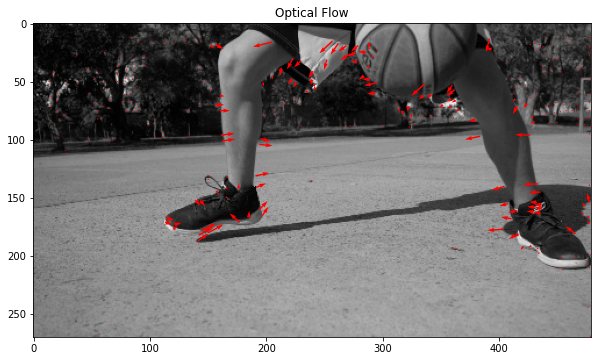

In [20]:
feature_tracker.run(image_dir="./data/basketball", visualize_optical_flow=True)

## Question  3.2 (2-*pts*)

Why do we need feature tracking even though we can detect features for each and every frame?

Combining feature tracking with feature detecion is a commonly chosen approach in computer vision. Such a fusion brings forth numerous benefits, a few of which include:

- Reduced computational complexity - most of the feature detection algorithms are expensive and reguire significant computational resources. Hence, by detecting the features of interest once and then only tracking them through an image sequence we could potentially may make our algorith more efficient and lightweight.

- Tracking specific features or objects - detection algorithms provide us with a framework for analyzing each frame separately; thus, without any previous context or knowledge about the features/objects present in the image. By introducing feature tracking, we can process the image sequence as a whole, allowing us to distinguish the detected image features from one another and analyze their motion. 

Furthermore, depending on the tracking algorithm it could also be beneficial in case of object occlusions and ensure consistency in our detections.


# X Individual Contribution Report *(Mandatory)*

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.


Name: Fien De Kok

Contribution on research: 33% \
Contribution on programming: 33% \
Contribution on writing: 33% 

Name: Jakub Tomaszewski

Contribution on research: 33% \
Contribution on programming: 33% \
Contribution on writing: 33% 

Name: Joan Valja

Contribution on research: 33% \
Contribution on programming: 33% \
Contribution on writing: 33% 

# - End of notebook -